In [262]:
import numpy as np
from matplotlib import pyplot as plt

First we create all the line bundles and find all their intersections

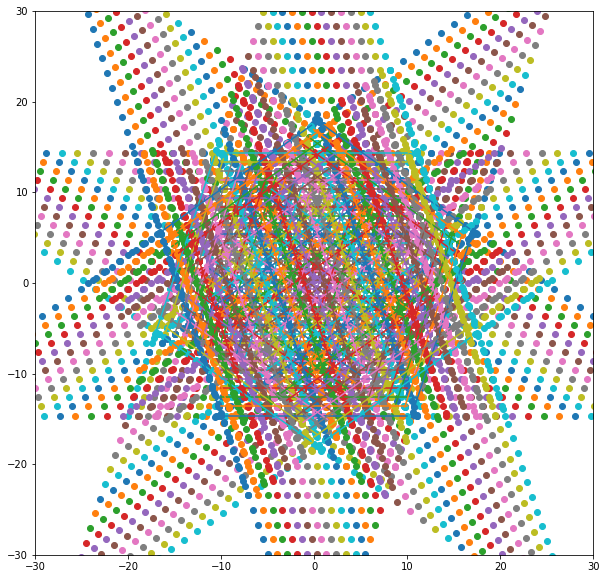

In [261]:
from scipy import linalg as la
number_of_lines = 30
disorder = 1

fig, ax = plt.subplots(figsize = (10,10))
lim = number_of_lines
radius = number_of_lines/1.8
ax.set_ylim(-lim, lim)
ax.set_xlim(-lim, lim)

angles = np.arange(5)*(2*np.pi/5)
gradients = np.array([ [np.cos(a), np.sin(a)] for a in angles])
normals = np.array([ [np.cos(a+np.pi/2), np.sin(a+np.pi/2)] for a in angles])

line_offsets = np.arange(number_of_lines) - (number_of_lines-1)/2
random_offsets = disorder*(np.random.random(5)-0.5)  
total_offsets = line_offsets[np.newaxis,:]+random_offsets[:,np.newaxis]

c_values = total_offsets[:,:,np.newaxis]*normals[:,np.newaxis,:]


# plot all the lines
nu_range = np.linspace(-10,10,100)
for b in range(5):
    for l in range(number_of_lines):
        g = gradients[b]
        c = c_values[b,l]
        x = g[0]*nu_range + c[0]
        y = g[1]*nu_range + c[1]

        plt.plot(x,y)


# find the vertices
all_vertices = np.zeros([10*number_of_lines**2, 2])
all_bundle_intersections = np.zeros([10*number_of_lines**2, 2])
all_line_intersections = np.zeros([10*number_of_lines**2, 2])
all_line_positions = np.zeros([10*number_of_lines**2, 2])

count = 0
# for each pair of bundles
for b1 in range(5):
    for b2 in range(b1+1,5):

        m1 = gradients[b1]
        m2 = gradients[b2]
        M = np.array([m1,-m2]).T
        inv = la.inv(M)

        # for each pair of lines find the intersection
        for l1 in range(number_of_lines):
            for l2 in range(number_of_lines):
                
                c = c_values[b2,l2] - c_values[b1,l1] 
                nu = inv @ c
                pos1 = m1*nu[0] + c_values[b1,l1]
                pos2 = m2*nu[1] + c_values[b2,l2]

                # plt.scatter(pos1[0],pos1[1])
                plt.scatter(pos2[0],pos2[1])
                all_vertices[count] = pos1
                all_bundle_intersections[count] = np.array([b1,b2])
                all_line_intersections[count] = np.array([l1,l2])
                all_line_positions[count] = nu
                count +=1



Now we find all the edges that connect points

In [263]:
# find the edges
number_edges = 5*number_of_lines*(4*number_of_lines-1)
all_edges = np.full([number_edges,2], -1)
edge_types = np.full([number_edges], -1)

for b in range(5):
    bundle_find = np.any(all_bundle_intersections == b, axis=1)
    for l in range(number_of_lines):
        insertion_point = np.nonzero(all_edges == -1)[0][0]
        vi = np.where((all_line_intersections == l)*(all_bundle_intersections == b))
        vertex_number, index = vi

        nu_values = all_line_positions[vi]
        order = np.argsort(nu_values)

        new_edges = np.concatenate([vertex_number[order[:-1],np.newaxis],vertex_number[order[1:],np.newaxis]], axis = 1 )
        edge_types[insertion_point: insertion_point+ new_edges.shape[0]] = b
        all_edges[insertion_point: insertion_point+ new_edges.shape[0]] = new_edges
        


8851
Lattice(9000 vertices, 17850 edges)


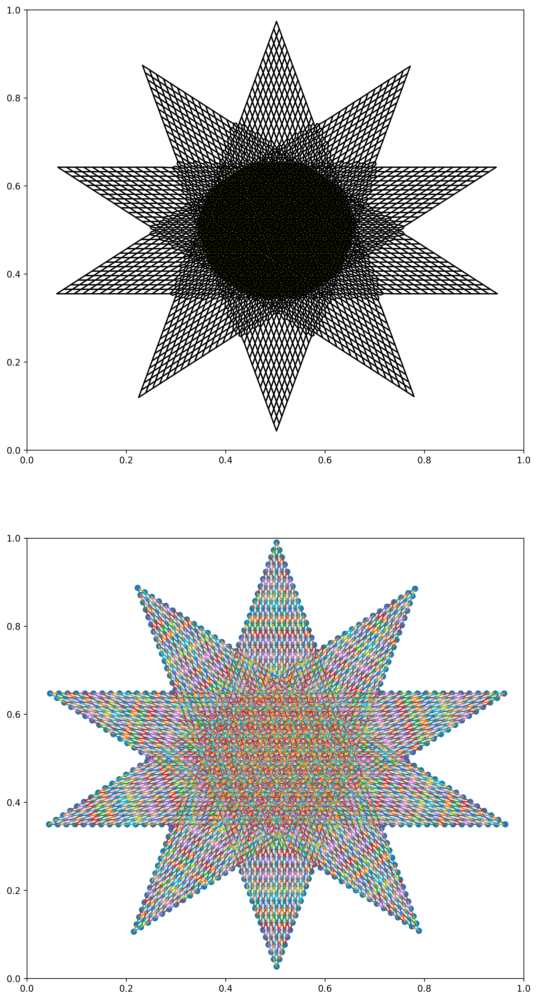

In [264]:
from koala.lattice import Lattice
from koala.plotting import plot_edges, plot_plaquettes
from koala.graph_utils import make_dual, remove_vertices, remove_trailing_edges

furthest_point = np.max(all_vertices)

scaling = 0.98/(2*furthest_point)

scaled_verts = all_vertices*scaling +0.5

lattice = Lattice(scaled_verts, all_edges,all_edges*0)

dual = make_dual(lattice)

fig, axes = plt.subplots(2,1,figsize = (10,20),dpi = 300)


plot_edges(dual, ax=axes[0])
plot_edges(dual, ax=axes[1], color_scheme = 'lightgrey')


axes[1].scatter(scaled_verts[:,0], scaled_verts[:,1])
for edge in all_edges:
    e = scaled_verts[edge].T
    axes[1].plot(e[0], e[1])

print(len(lattice.plaquettes))
print(lattice)


radius = scaling*number_of_lines/2
circle = plt.Circle((0.5,0.5), radius, color='y')
axes[0].add_patch(circle)



<AxesSubplot:>

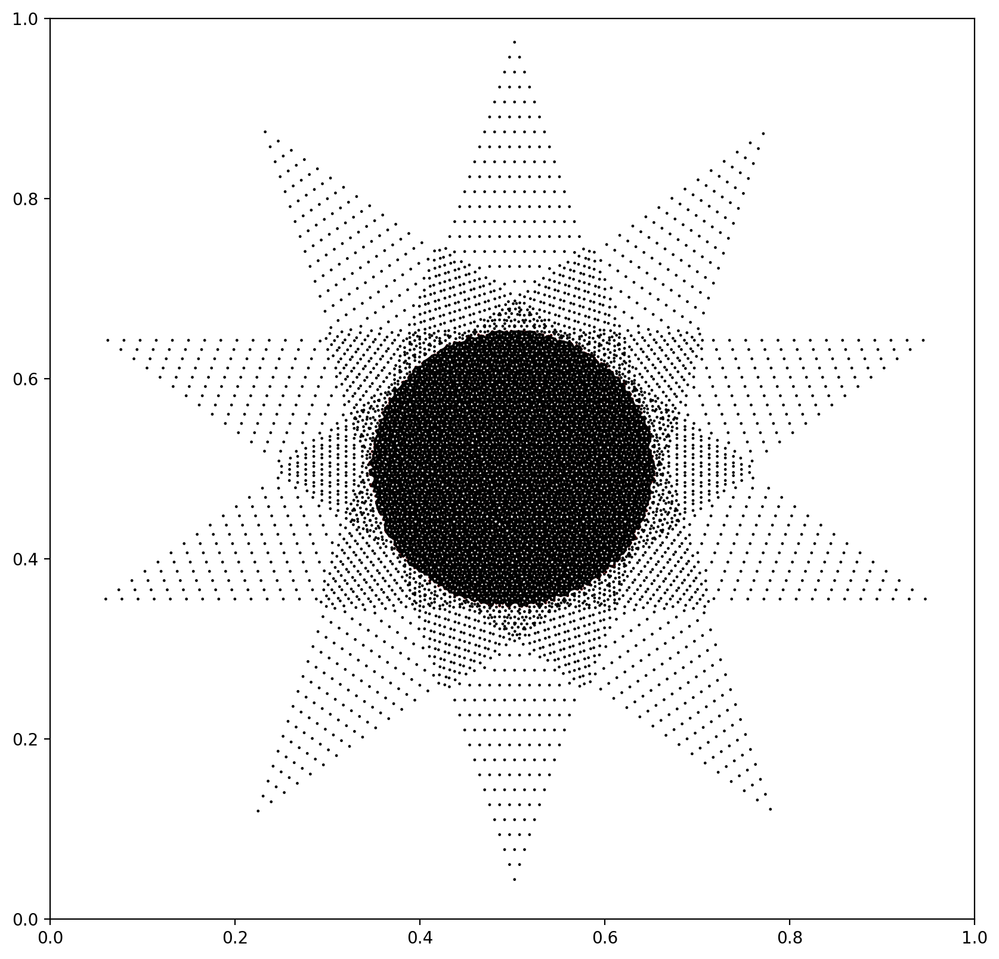

In [265]:
fig, ax = plt.subplots(figsize = (10,10), dpi = 200)

vertex_radii = np.sqrt(np.sum((dual.vertices.positions-0.5)**2, axis = 1))

# plt.scatter(dual.vertices.positions[:,0], dual.vertices.positions[:,1],c = vertex_radii/max(vertex_radii), s = 0.5, cmap = 'flag')
plt.scatter(dual.vertices.positions[:,0], dual.vertices.positions[:,1],c = vertex_radii > radius, s = 0.5, cmap = 'flag')

remove = np.where(vertex_radii > radius)[0]


dual_clipped = remove_vertices(dual, remove)
plot_edges(dual_clipped, ax=ax)

Finally, we find the position of every vertex in terms of out line bundles

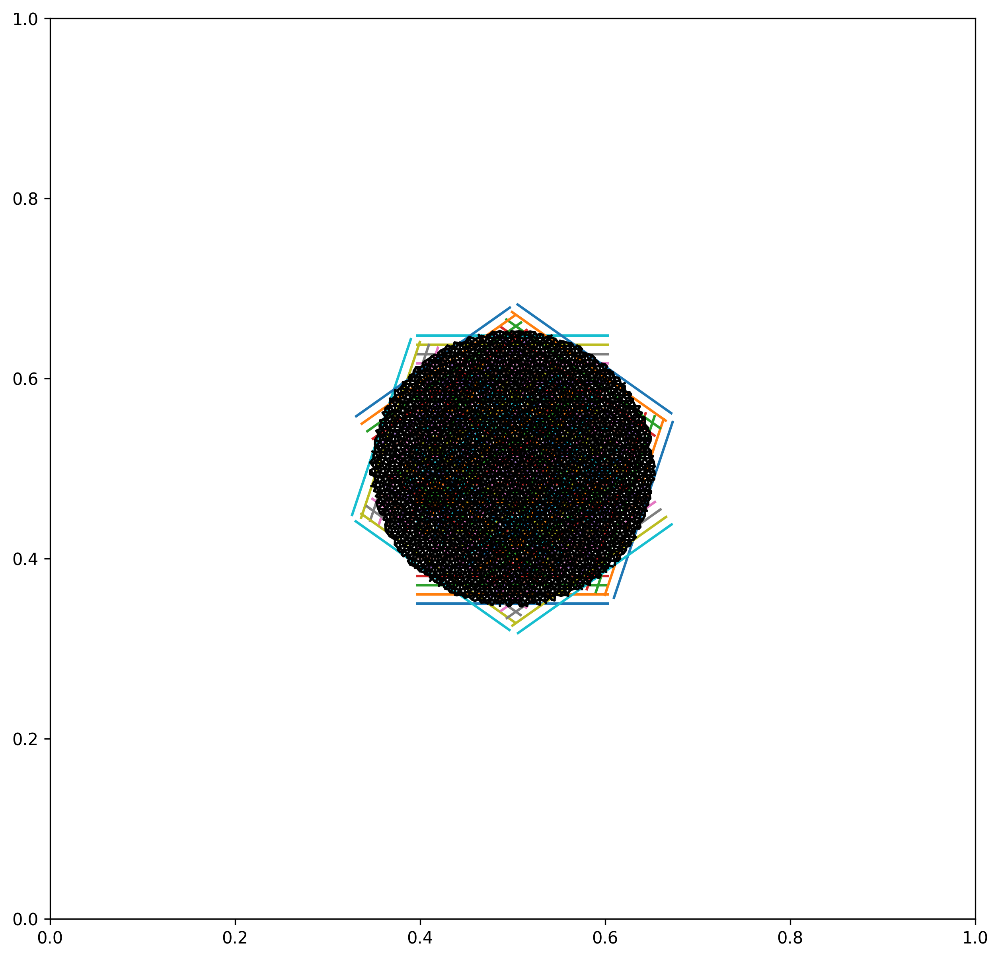

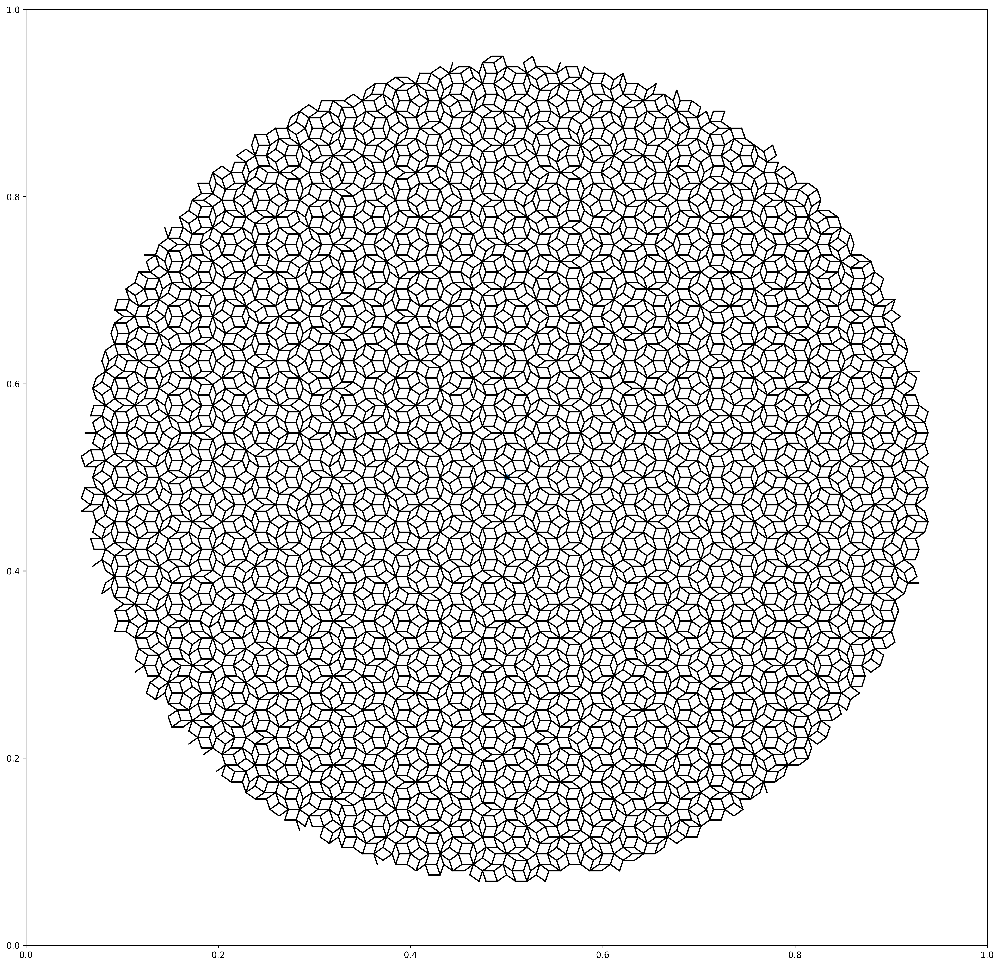

In [266]:
fig, ax = plt.subplots(1,1,figsize = (10,10), dpi = 300)

new_gradients = scaling*gradients
new_normals = scaling*normals
new_c_values = scaling*c_values + 0.5
starting_positions = new_c_values[:,0,:]



# plot all the lines
nu_range = np.linspace(-10,10,100)
for b in range(4):
    for l in range(number_of_lines):
        g = new_gradients[b]
        c = new_c_values[b,l]
        x = g[0]*nu_range + c[0]
        y = g[1]*nu_range + c[1]

        plt.plot(x,y)

plot_edges(dual_clipped, ax=ax)


def find_pent_index(point):
    shifted_vals = point[np.newaxis,:] - starting_positions
    distance = np.sum(shifted_vals*normals, axis = 1)/scaling
    return distance//1

def map_to_position(index):
    x = np.sum(index*np.cos(angles))
    y = np.sum(index*np.sin(angles))
    return np.array([x,y])

new_points = np.zeros_like(dual_clipped.vertices.positions)
for n , point in enumerate(dual_clipped.vertices.positions):
    new_points[n] = map_to_position(find_pent_index(point))

scale2 = 0.9/(2*np.max(new_points)) 
new_points = new_points * scale2 + 0.5
plt.show()

final_lattice = Lattice(new_points, dual_clipped.edges.indices, dual_clipped.edges.crossing)

fig, ax = plt.subplots(1,1,figsize = (20,20), dpi = 300)
plot_edges(final_lattice)
plt.scatter(0.5,0.5)


In [267]:
new_points

array([[0.08269073, 0.635592  ],
       [0.07904673, 0.62437694],
       [0.08269073, 0.61316188],
       ...,
       [0.16941187, 0.77118401],
       [0.20392828, 0.81869177],
       [0.22890459, 0.8507007 ]])